In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import numpy as np
import pywt
import matplotlib.pyplot as plt
from skimage.metrics import mean_squared_error
from google.colab.patches import cv2_imshow
from skimage import transform
from skimage.metrics import mean_squared_error

In [3]:
lena = cv2.imread("/content/drive/MyDrive/Images/6/Lena.bmp")
baboon = cv2.imread("/content/drive/MyDrive/Images/6/Baboon.bmp")
harris = cv2.imread("/content/drive/MyDrive/Images/7/harris.JPG")
sl,sm,sr = cv2.imread("/content/drive/MyDrive/Images/7/sl.jpg"),cv2.imread("/content/drive/MyDrive/Images/7/sm.jpg"),cv2.imread("/content/drive/MyDrive/Images/7/sr.jpg")

#6 Color

##6.1 Color Space

###6.1.1

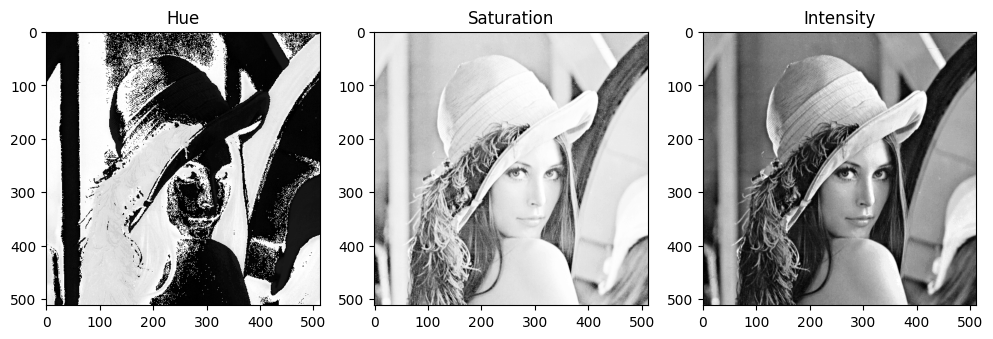

In [ ]:
img = lena.copy()

def RGB_to_HSI(img):
  img = img.astype(np.float64) / 255.0
  # img = img/255.0
  R = img[:,:,2]
  G = img[:,:,1]
  B = img[:,:,0]

  I = (R + G + B)/3.0

  S = 1 - 3 * (np.min([R,G,B]))/(R + G + B)

  num = 0.5 * ((R - G) + (R - B))
  den = np.sqrt((R - G)**2 + (R - B) * (G - B))
  theta = np.arccos(num / (den))
  H = np.where(B > G, 2 * np.pi - theta , theta)

  H = H / (2 * np.pi)

  return H , S , I


H , S , I = RGB_to_HSI(img)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title('Hue')
plt.imshow(H, cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Saturation')
plt.imshow(S, cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Intensity')
plt.imshow(I, cmap='gray')

plt.show()

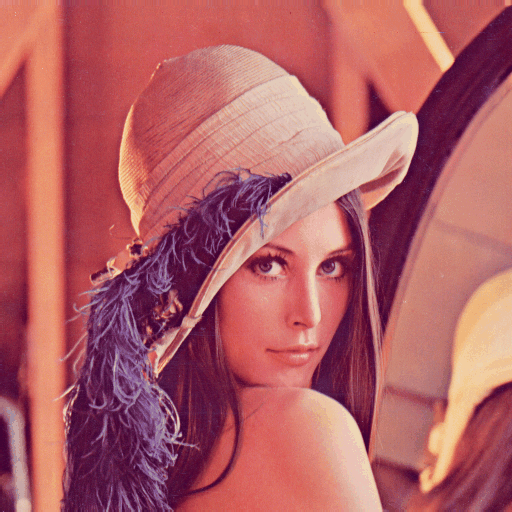

In [ ]:
cv2_imshow(img)

In [ ]:
# Save H, S, I components as double precision images
cv2.imwrite('lena_hue.png', (H * 255).astype(np.uint8))
cv2.imwrite('lena_saturation.png', (S * 255).astype(np.uint8))
cv2.imwrite('lena_intensity.png', (I * 255).astype(np.uint8))

HSI = np.stack((H, S, I), axis=-1)

# Save the HSI image in double precision
np.save('lena_hsi.npy', HSI)

Explanation of HSI Components:

---
Hue(H): Represent's color type in image. we can see that areas with same color have similar grayscale in displayed Hue image . for example the skin color tone is displayed with near black color in Hue and we can see the hat and the skin with nearly similar color in the original image will have near similar grayscale in Hue image.

---
Saturation(S): Saturation show us the purity of color . in other word saturation show us if the value of white is high in the pixel. high saturation means vivid color while low saturation show us the grayish colors. in the grayscale saturation image , the bright areas has higher saturation.


---


Intensity(I): Intensity is the average of RGB channels which represents the brightenss of the color. We can see that most of the data is stored in Intensity.

##6.1.2

Other color Spaces that was not discussed in class:


---

XYZ(CIE 1931): Its a color space based on human vision which was designed to be device independent.
It was used for Color Science, color matching and conversion between different color spaces.
 X and z represents a mix of cone response curves and Y represents luminance .
 Its a foundational color space in color science and is used to derive other color spaces like Lab*.

---

HSL : Its a cylindrical representation of colors where lightness represents the range from black to white , which is more intuitive for human interpretation. The components are Hue , Saturation and Lightness which represent brightness. It is used in Graphics,web design and image editing. Its often preferred for tasks requiring user interaction with colors as its aligns closely with human perception.
Conversion from RGB to HSL involves:
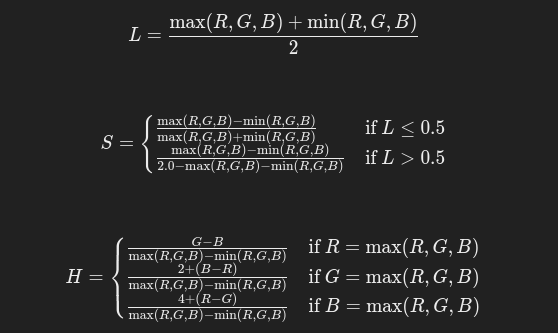


---

YUV : This color space separates luminance from chrominance. It is used in Broadcast television and video compression. The components are Y:Luminance , U:Chrominance(blue projection) , V:Chrominance(red projection). It is efficient for compressing video and image data because human vision is more sensitive to luminance changes than chrominance changes.


---

​YIQ : It is a color space used in the NTSC color TV system , where Y represents luminance and I , Q represent chrominance .
Components are Y:Luminance , I:In-phase(orange-cyan) , Q:Quadrature(purple_green).This color space optimizes bandwith usage in analog TV by reducing chrominance resolution.


---

LUV (CIELUV) : Its a perceptually uniform color space based on human vision, similar to Lab but with a different approach to chrominance. Its components are L:Lightness , U:Chrominance(blue-yellow) , V:Chrominance(red-green).
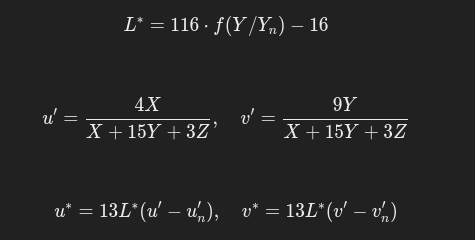

LUV is useful for color comparison and ensuring perceptual uniformity.

#6.2

##6.2.1

**********
Quantization_level:64
MSE:7.53173828125
PSNR:39.36185140466424
**********
**********
Quantization_level:32
MSE:25.099212646484375
PSNR:34.134202628390796
**********
**********
Quantization_level:16
MSE:80.64962768554688
PSNR:29.0647799403426
**********
**********
Quantization_level:8
MSE:96.23091888427734
PSNR:28.297657280877626
**********


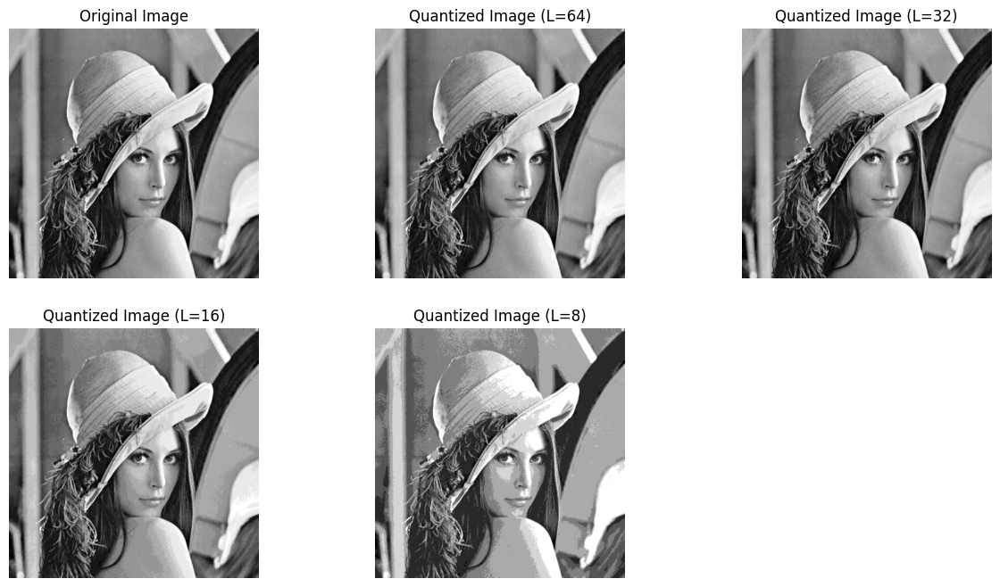

In [ ]:
img = lena.copy()
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

L_values = [64,32,16,8]

quantized_imgs = []

for L in L_values:
  quantized_img = img / 255.0
  quantized_img = np.floor(quantized_img * L) / L
  quantized_img = (quantized_img * 255).astype(np.uint8)
  quantized_imgs.append(quantized_img)

  mse = np.mean((img - quantized_img)**2)
  psnr = 20 * np.log10(255 / np.sqrt(mse))

  print(f"**********\nQuantization_level:{L}\nMSE:{mse}\nPSNR:{psnr}\n**********")
  # cv2_imshow(quantized_img)

plt.figure(figsize=(15, 8))
plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

for i, (quantized_img, L) in enumerate(zip(quantized_imgs, L_values)):
    plt.subplot(2, 3, i + 2)
    plt.title(f'Quantized Image (L={L})')
    plt.imshow(quantized_img, cmap='gray')
    plt.axis('off')
    cv2.imwrite(f'quantized_L{L}.png', quantized_img)

plt.show()

By analysing the results we can say that as we thaught by decreasing the L we will have less graylevels to represent the image with therefore we will have a image with less quality . We can also see that in the increasing the MSE that happens after reducing L . Also PSNR keep decreasing while the L decrease and this too show us the drop in quality but also compression of image and need for less memory space.

##6.2.2

In [ ]:
def quantize(img,L):
  img = img / 255.0
  img = np.floor(img *L) / L
  img = (img * 255).astype(np.uint8)
  return img

(-0.5, 511.5, 511.5, -0.5)

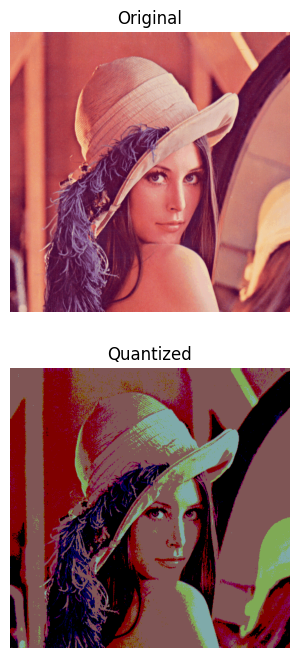

In [ ]:
img = lena.copy()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
R = img[:,:,2]
G = img[:,:,1]
B = img[:,:,0]

R_quantized = quantize(R,3)
G_quantized = quantize(G,3)
B_quantized = quantize(B,2)

img_quantized = cv2.merge((B_quantized,G_quantized,R_quantized))


plt.figure(figsize=(15, 8))

plt.subplot(2, 1, 1)
plt.title('Original')
plt.imshow(img)
plt.axis('off')

plt.subplot(2, 1, 2)
plt.title('Quantized')
plt.imshow(img_quantized)
plt.axis('off')

(-0.5, 511.5, 511.5, -0.5)

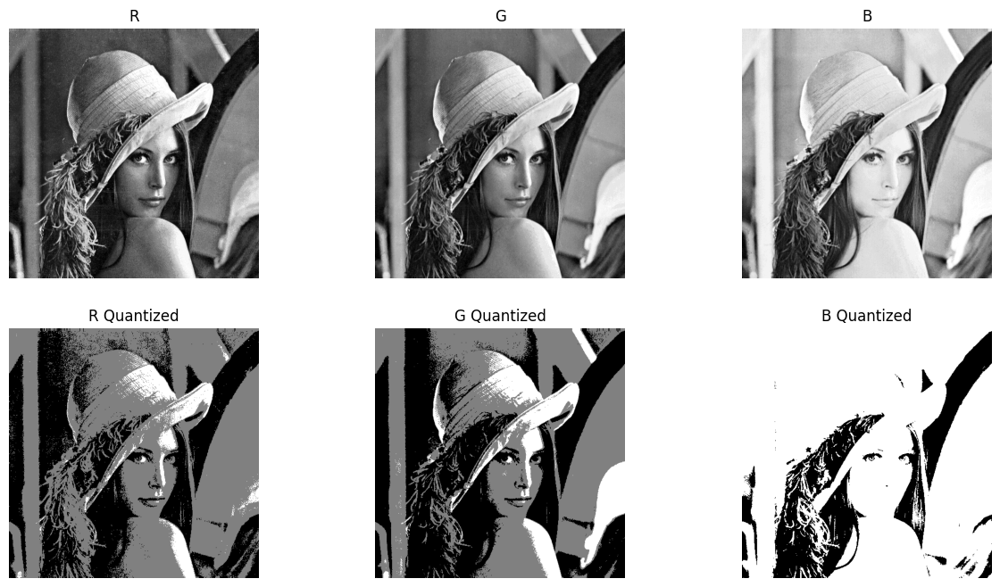

In [ ]:
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.title('R')
plt.imshow(R, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('G')
plt.imshow(G, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('B')
plt.imshow(B, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.title('R Quantized')
plt.imshow(R_quantized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('G Quantized')
plt.imshow(G_quantized, cmap='gray')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.title('B Quantized')
plt.imshow(B_quantized, cmap='gray')
plt.axis('off')

In [ ]:
mse = np.mean((img - img_quantized)**2)
psnr = 20 * np.log10(255 / np.sqrt(mse))

print(f"**********\nQuantization_level:3,3,2\nMSE:{mse}\nPSNR:{psnr}\n**********")

**********
Quantization_level:3,3,2
MSE:83.06657282511394
PSNR:28.936540682291508
**********


From PSNR and MSE we can see that the quantized image is very different from original image.

We can see that after quantization each channel to the asked Level which are 3 for red and green and 2 for blue , we will have a quantized image with 3 levels of red , 3 levels of green and 2 levels of blue. This results in low accuracy of colored image but we also could save the image in smaller memory (3x3x2 bit)

---



In the second part i displayed each channel before and after quantization wich it show us the drop in accuracy of each channel. The red and green channel is seperated into two grayscale levels and the blue channel only has two grayscale level.

---
We could also see that for this specific image we didnt lose much data in blue channel and the reason is the low appearence of blue in lena image wich show us if we have an image with low precense of one channel we can compress data of channel and maintain reasonable accuracy.


##6.2.3

In [ ]:
img = baboon.copy()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

levels = [32,16,8]

R = img[:,:,2]
G = img[:,:,1]
B = img[:,:,0]

quantized_list = []
for L in levels:
  B_quantized = quantize(B,L)
  R_quantized = quantize(R,L)
  G_quantized = quantize(G,L)
  img_quantized = cv2.merge((B_quantized,G_quantized,R_quantized))
  quantized_list.append(img_quantized)

  mse = np.mean((img - img_quantized)**2)
  psnr = 20 * np.log10(255 / np.sqrt(mse))

  print(f"**********\nQuantization_level:{L}\nMSE:{mse}\nPSNR:{psnr}\n**********")

**********
Quantization_level:32
MSE:25.418865203857422
PSNR:34.079242027971944
**********
**********
Quantization_level:16
MSE:76.97422281901042
PSNR:29.26735048185421
**********
**********
Quantization_level:8
MSE:92.82856750488281
PSNR:28.45398712230012
**********


(-0.5, 511.5, 511.5, -0.5)

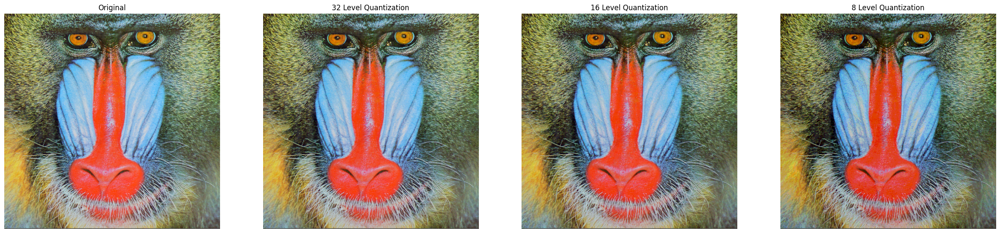

In [ ]:
plt.figure(figsize=(30, 15))

plt.subplot(1, 4, 1)
plt.title('Original')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title('32 Level Quantization')
plt.imshow(quantized_list[0])
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title('16 Level Quantization')
plt.imshow(quantized_list[1])
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title('8 Level Quantization')
plt.imshow(quantized_list[2])
plt.axis('off')

From PSNR and MSE we can see that with higher quantization level the result will be more similar to the original image but when we decrease the levels of quanization , the result will be furter from original image.

---

Also when we analyze the result with eye we can see that the image look very similar with even 8 levels of quantization which means we can weave the rug with even 8 level the image. but after i test the results for lower level of 4 , i saw that the difference begin to be noticable at that level.

#7 Features

##7.1 Harris Corner Detec

###7.1.1

In [ ]:
#it will find the corners
def harris_corner_detector(img,k=0.04,threshold=0.001):

  #gradient
  Ix = cv2.Sobel(img,cv2.CV_64F, 1,0,ksize=3)
  Iy = cv2.Sobel(img,cv2.CV_64F, 0,1,ksize=3)

  #prodcut of Gradients
  Ixx = Ix**2
  Iyy = Iy**2
  Ixy = Ix*Iy

  #Sum of products wich is smoothed with Gaussian
  Sxx = cv2.GaussianBlur(Ixx, (3,3), 0)
  Syy = cv2.GaussianBlur(Iyy, (3,3), 0)
  Sxy = cv2.GaussianBlur(Ixy, (3,3), 0)

  #harris response
  detM = Sxx * Syy - Sxy**2
  traceM = Sxx + Syy
  R = detM - k * (traceM**2)

  #Threshold
  corners = np.zeros_like(R)
  corners[R > threshold * R.max()] = 255

  return corners


In [ ]:
#it will use the corner_detector on different scales and save the coordinate of corners
def detect_corner_at_scales(img,scales):
  all_corners = []
  for scale in scales:
    resized_img = cv2.resize(img,(0,0),fx=scale,fy=scale)
    corners = harris_corner_detector(resized_img)
    corner_coords = np.argwhere(corners)
    corner_coords = (corner_coords / scale).astype(int)
    all_corners.append(corner_coords)
  return all_corners

In [ ]:
img = harris.copy()

scales = [1.0, 0.75, 0.5, 0.25]

corners = detect_corner_at_scales(img,scales)

**************
Corners at scale : 1.0
**************


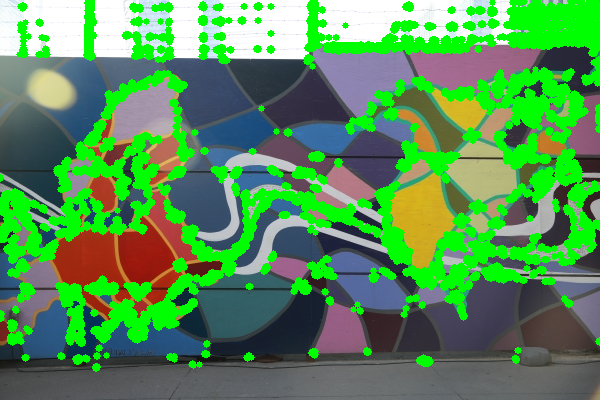

**************
Corners at scale : 0.75
**************


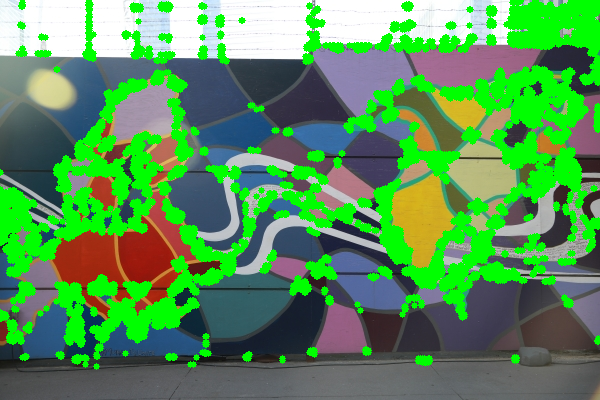

**************
Corners at scale : 0.5
**************


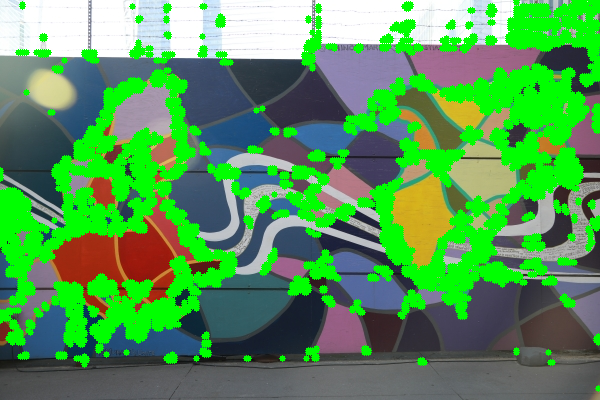

**************
Corners at scale : 0.25
**************


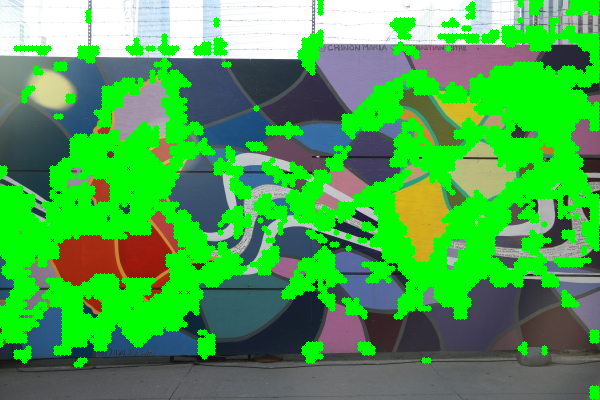

In [ ]:
#Display

for i in range(len(scales)):
  img_with_corners = img.copy()
  for corner in corners[i]:
    cv2.circle(img_with_corners, (corner[1], corner[0]), radius=3, color=(0, 255, 0), thickness=-1)
  print(f"**************\nCorners at scale : {scales[i]}\n**************")
  cv2_imshow(img_with_corners)

from the result we can see that when we reduce scale from 1 to 0 when we have 1 it will detect fine details and small corners accuratly but when the scale decrease we will detect only the most prominent corners with decreased accuracy. This is expected beacuse resizing the image reducess the resolution, which smooths out finer details.

---


Keep in mind that i used scales between 0 and 1 but you could have scales that are greater than 1 but have to use 1/scale instead.

##7.2

###7.2.1

In [ ]:
def SIFT(img):
  sift = cv2.SIFT_create()
  keypoints, descriptors = sift.detectAndCompute(img,None)
  return keypoints, descriptors

In [ ]:
def SURF(img):
  surf = cv2.xfeatures2d.SURF_create(hessianThreshold=400)
  keypoints, descriptors = surf.detectAndCompute(img,None)
  return keypoints, descriptors

In [ ]:
def match_descriptors(a,b):
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
  matches = bf.match(a,b)
  matches = sorted(matches, key = lambda x:x.distance)# it will sort the matches based on distance
  return matches

In [ ]:
def draw_matches(img1,keypoints1,img2,keypoints2,matches):
  matched_img = cv2.drawMatches(img1,keypoints1,img2,keypoints2,matches[:50],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  return matched_img

In [ ]:
def display(images,titles):
  plt.figure(figsize=(20, 10))
  for i in range(len(images)):
      plt.subplot(1, len(images), i + 1)
      plt.title(titles[i])
      plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
      plt.axis('off')
  plt.show()

In [ ]:
#SURF
images = [sl,sm,sr]

keypoints_and_descriptors = [SURF(img) for img in images]

matches1 = match_descriptors(keypoints_and_descriptors[0][1],keypoints_and_descriptors[1][1])
matches2 = match_descriptors(keypoints_and_descriptors[1][1],keypoints_and_descriptors[2][1])
matches3 = match_descriptors(keypoints_and_descriptors[0][1],keypoints_and_descriptors[2][1])


matched_img1 = draw_matches(images[0],keypoints_and_descriptors[0][0],images[1],keypoints_and_descriptors[1][0],matches1)
matched_img2 = draw_matches(images[1],keypoints_and_descriptors[1][0],images[2],keypoints_and_descriptors[2][0],matches2)
matched_img3 = draw_matches(images[0],keypoints_and_descriptors[0][0],images[2],keypoints_and_descriptors[2][0],matches3)

display([images[0], images[1], images[2]], ['Left Image', 'Middle Image', 'Right Image'])
display([matched_img1, matched_img2,matched_img3], ['Matches (Left-Middle)', 'Matches (Middle-Right)','Matches (Left-Right)'])

As you can see we are not able to use SURF because its patented and we need to have licence to use it. But this code work as it does work with SIFT.

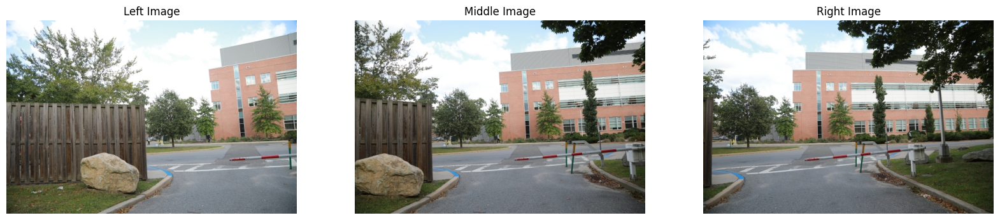

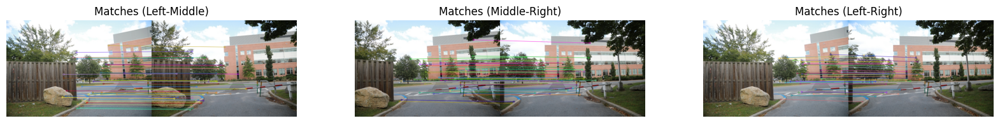

In [ ]:
#SIFT
images = [sl,sm,sr]

keypoints_and_descriptors = [SIFT(img) for img in images]

matches1 = match_descriptors(keypoints_and_descriptors[0][1],keypoints_and_descriptors[1][1])
matches2 = match_descriptors(keypoints_and_descriptors[1][1],keypoints_and_descriptors[2][1])
matches3 = match_descriptors(keypoints_and_descriptors[0][1],keypoints_and_descriptors[2][1])


matched_img1 = draw_matches(images[0],keypoints_and_descriptors[0][0],images[1],keypoints_and_descriptors[1][0],matches1)
matched_img2 = draw_matches(images[1],keypoints_and_descriptors[1][0],images[2],keypoints_and_descriptors[2][0],matches2)
matched_img3 = draw_matches(images[0],keypoints_and_descriptors[0][0],images[2],keypoints_and_descriptors[2][0],matches3)

display([images[0], images[1], images[2]], ['Left Image', 'Middle Image', 'Right Image'])
display([matched_img1, matched_img2,matched_img3], ['Matches (Left-Middle)', 'Matches (Middle-Right)','Matches (Left-Right)'])

We have to implement this steps by order


1.   Detect keypoints and descriptors(using eigther SURF or SIFT)
2.   Match descriptors
3.   Draw Matches



---

Results:


*   SIFT is effective for detecting and describing local features.
*   SURF use the similar process but its faster due to usage of Integral images and different approach to scale_space representation.This should result in small drop in accuracy but its negligable.also it may be a little smoothed due to usage of boxfilter .



###7.2.2

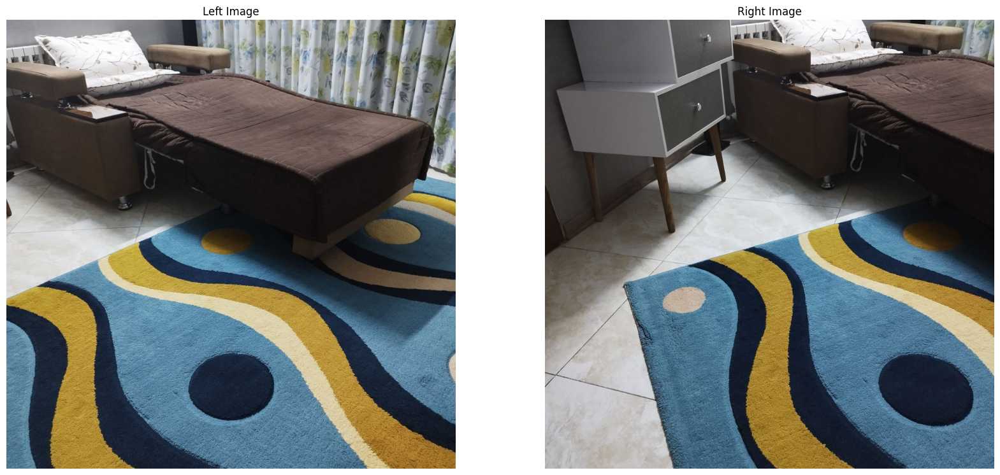

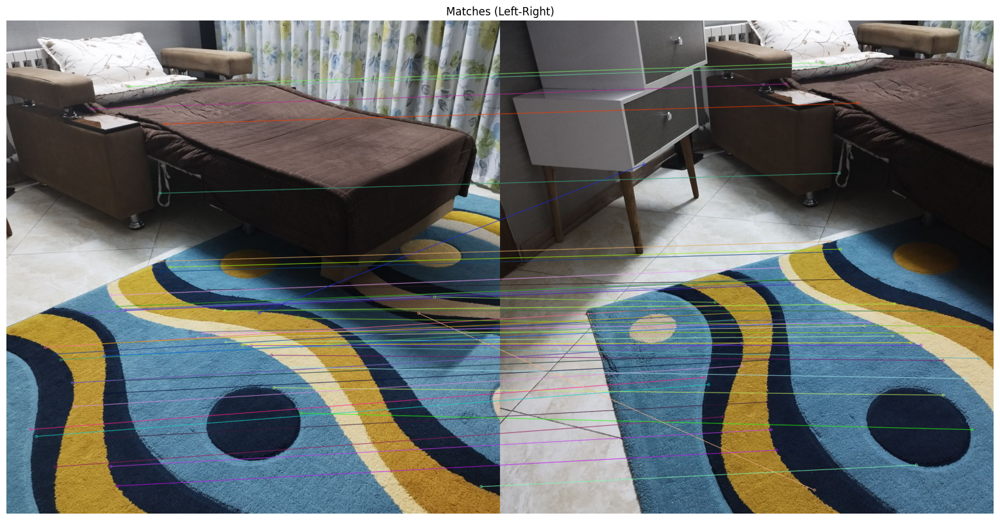

In [ ]:
img1 = cv2.imread('/content/photo_2024-06-08_02-16-46.jpg')
img2 = cv2.imread('/content/photo_2024-06-08_02-16-52.jpg')


#SIFT
images = [img1,img2]

keypoints_and_descriptors = [SIFT(img) for img in images]

matches = match_descriptors(keypoints_and_descriptors[0][1],keypoints_and_descriptors[1][1])

matched_img = draw_matches(images[0],keypoints_and_descriptors[0][0],images[1],keypoints_and_descriptors[1][0],matches)

display([images[0], images[1]], ['Left Image', 'Right Image'])
display([matched_img], ['Matches (Left-Right)'])

Its possible to do the same thing using SURF

In [ ]:
img1 = cv2.imread('/content/photo_2024-06-08_02-16-46.jpg')
img2 = cv2.imread('/content/photo_2024-06-08_02-16-52.jpg')

#SURF

images = [img1,img2]

keypoints_and_descriptors = [SURF(img) for img in images]

matches = match_descriptors(keypoints_and_descriptors[0][1],keypoints_and_descriptors[1][1])

matched_img = draw_matches(images[0],keypoints_and_descriptors[0][0],images[1],keypoints_and_descriptors[1][0],matches)

display([images[0], images[1]], ['Left Image', 'Right Image'])
display([matched_img], ['Matches (Left-Right)'])